In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

from pandas import set_option
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.neighbors import LocalOutlierFactor

import warnings
warnings.filterwarnings("ignore")

In [2]:
ener = pd.read_csv('C:/Users/AJ/Documents/Workspace/Projects/Main Proj/Energy Consumption/energydata_complete.csv')
ener.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [3]:
# renaming the columns
energy = ener.rename(columns = {'date' : 'date_time', \
'Appliances' : 'a_energy', \
'lights' : 'l_energy', \
'T1' : 'kitchen_temp', \
'RH_1' : 'kitchen_hum', \
'T2' : 'liv_temp', \
'RH_2' : 'liv_hum', \
'T3' : 'laun_temp', \
'RH_3' : 'laun_hum', \
'T4' : 'off_temp', \
'RH_4' : 'off_hum', \
'T5' : 'bath_temp', \
'RH_5' : 'bath_hum', \
'T6' : 'out_b_temp', \
'RH_6' : 'out_b_hum', \
'T7' : 'iron_temp', \
'RH_7' : 'iron_hum', \
'T8' : 'teen_temp', \
'RH_8' : 'teen_hum', \
'T9' : 'par_temp', \
'RH_9' : 'par_hum', \
'T_out' : 'out_temp', \
'Press_mm_hg' : 'out_press', \
'RH_out' : 'out_hum', \
'Windspeed' : 'wind', \
'Visibility' : 'visibility', \
'Tdewpoint' : 'dew_point', \
'rv1' : 'rv1', \
'rv2' : 'rv2'})


In [32]:
energy.head()

,date_time,a_energy,l_energy,kitchen_temp,kitchen_hum,liv_temp,liv_hum,laun_temp,laun_hum,off_temp,...,par_temp,par_hum,out_temp,out_press,out_hum,wind,visibility,dew_point,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [9]:
# converting the datetime column from string to datetime format
energy['date_time'] = pd.to_datetime(energy.date_time)
energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date_time     19735 non-null  datetime64[ns]
 1   a_energy      19735 non-null  int64         
 2   l_energy      19735 non-null  int64         
 3   kitchen_temp  19735 non-null  float64       
 4   kitchen_hum   19735 non-null  float64       
 5   liv_temp      19735 non-null  float64       
 6   liv_hum       19735 non-null  float64       
 7   laun_temp     19735 non-null  float64       
 8   laun_hum      19735 non-null  float64       
 9   off_temp      19735 non-null  float64       
 10  off_hum       19735 non-null  float64       
 11  bath_temp     19735 non-null  float64       
 12  bath_hum      19735 non-null  float64       
 13  out_b_temp    19735 non-null  float64       
 14  out_b_hum     19735 non-null  float64       
 15  iron_temp     19735 non-null  float6

In [20]:
energy.describe().T

,count,mean,std,min,25%,50%,75%,max
a_energy,19735.0,97.694958,102.524891,10.000000,50.000000,60.000000,100.000000,1080.000000
l_energy,19735.0,3.801875,7.935988,0.000000,0.000000,0.000000,0.000000,70.000000
kitchen_temp,19735.0,21.686571,1.606066,16.790000,20.760000,21.600000,22.600000,26.260000
kitchen_hum,19735.0,40.259739,3.979299,27.023333,37.333333,39.656667,43.066667,63.360000
liv_temp,19735.0,20.341219,2.192974,16.100000,18.790000,20.000000,21.500000,29.856667
liv_hum,19735.0,40.420420,4.069813,20.463333,37.900000,40.500000,43.260000,56.026667
laun_temp,19735.0,22.267611,2.006111,17.200000,20.790000,22.100000,23.290000,29.236000
laun_hum,19735.0,39.242500,3.254576,28.766667,36.900000,38.530000,41.760000,50.163333
off_temp,19735.0,20.855335,2.042884,15.100000,19.530000,20.666667,22.100000,26.200000
off_hum,19735.0,39.026904,4.341321,27.660000,35.530000,38.400000,42.156667,51.090000


In [10]:
energy = energy.loc[:, ['date_time', 'kitchen_temp', 'kitchen_hum',
       'liv_temp', 'liv_temp', 'laun_temp', 'laun_hum', 'off_temp', 'off_hum',
       'bath_temp', 'bath_hum', 'out_b_temp', 'out_b_hum', 'iron_temp',
       'iron_hum', 'teen_temp', 'teen_hum', 'par_temp', 'par_hum', 'out_temp',
       'out_press', 'out_hum', 'wind', 'visibility', 'dew_point', 'rv1',
       'rv2', 'a_energy', 'l_energy']]
energy.head()

,date_time,kitchen_temp,kitchen_hum,liv_temp,liv_temp,laun_temp,laun_hum,off_temp,off_hum,bath_temp,...,out_temp,out_press,out_hum,wind,visibility,dew_point,rv1,rv2,a_energy,l_energy
0,2016-01-11 17:00:00,19.89,47.596667,19.2,19.2,19.79,44.730000,19.000000,45.566667,17.166667,...,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,60,30
1,2016-01-11 17:10:00,19.89,46.693333,19.2,19.2,19.79,44.790000,19.000000,45.992500,17.166667,...,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,60,30
2,2016-01-11 17:20:00,19.89,46.300000,19.2,19.2,19.79,44.933333,18.926667,45.890000,17.166667,...,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,50,30
3,2016-01-11 17:30:00,19.89,46.066667,19.2,19.2,19.79,45.000000,18.890000,45.723333,17.166667,...,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,50,40
4,2016-01-11 17:40:00,19.89,46.333333,19.2,19.2,19.79,45.000000,18.890000,45.530000,17.200000,...,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,60,40


In [70]:
# converting the datetime column from string to datetime format
energy['date_time'] = pd.to_datetime(energy.date_time)
energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date_time     19735 non-null  datetime64[ns]
 1   kitchen_temp  19735 non-null  float64       
 2   kitchen_hum   19735 non-null  float64       
 3   liv_temp      19735 non-null  float64       
 4   liv_hum       19735 non-null  float64       
 5   laun_temp     19735 non-null  float64       
 6   laun_hum      19735 non-null  float64       
 7   off_temp      19735 non-null  float64       
 8   off_hum       19735 non-null  float64       
 9   bath_temp     19735 non-null  float64       
 10  bath_hum      19735 non-null  float64       
 11  out_b_temp    19735 non-null  float64       
 12  out_b_hum     19735 non-null  float64       
 13  iron_temp     19735 non-null  float64       
 14  iron_hum      19735 non-null  float64       
 15  teen_temp     19735 non-null  float6

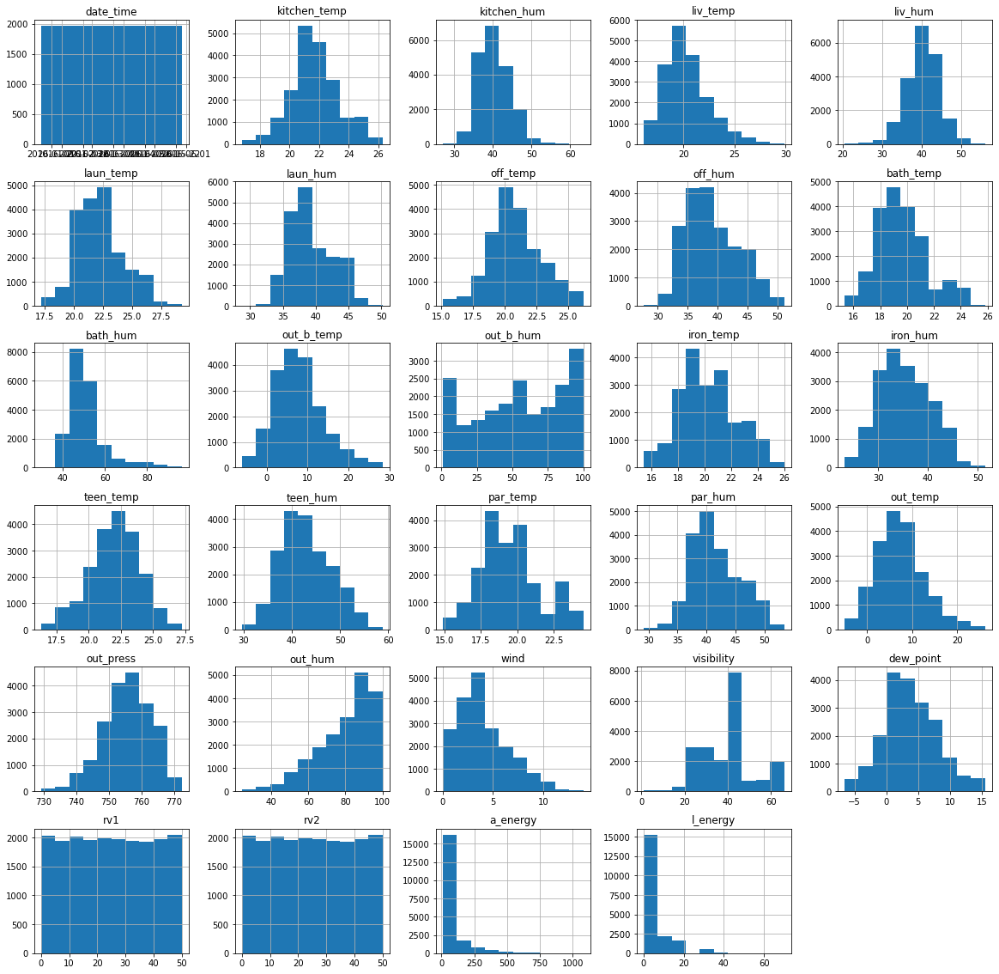

In [10]:
energy.hist()
plt.gcf().set_size_inches(20,20)
plt.show()

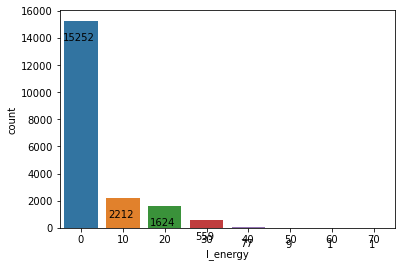

0     77.284013
10    11.208513
20     8.229035
30     2.832531
40     0.390170
50     0.045604
70     0.005067
60     0.005067
Name: l_energy, dtype: float64


In [34]:
# Analysis of the light consumption column
lEnergy = sns.countplot(x='l_energy', data=energy)
for a in lEnergy.patches:
    lEnergy.annotate(f'\n{a.get_height()}', (a.get_x()+0.35, a.get_height()), ha='center', va='top', color='black', size=10)
plt.show()
print(energy['l_energy'].value_counts(normalize=True)*100)

- 77.28% of Light fixtures consume 0 watt-hour(wh) in the house 
- 11.21% of Light fixtures consume 10 watt-hour(wh) in the house 
- 8.23% of Light fixtures consume 20 watt-hour(wh) in the house 
- 2.83% of Light fixtures consume 30 watt-hour(wh) in the house
- 0.45% of Light fixtures consume 40wh, 50wh, 70wh, and 60wh collectively in the house

This observation proves that; 
- only 22.72% of light fixtures consumes energy in the house. 
- 22.27% of light fixtures use low energies (10wh-30wh)
- The higher the energy use in wh, the lower the rates of light fixtures

Therefore, light fixtures are not the major consumers of energy in the house 

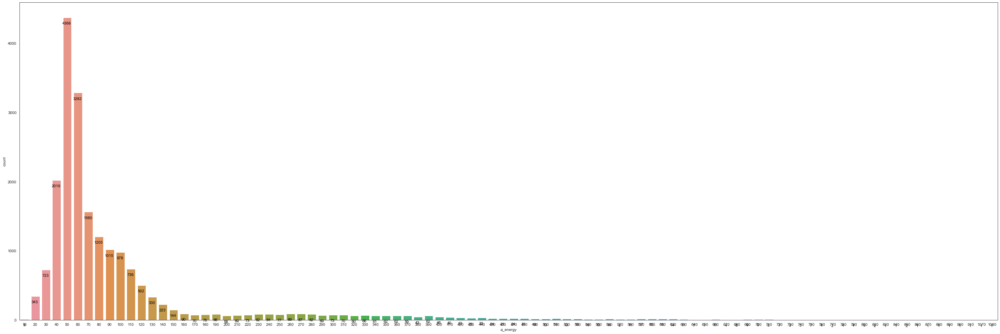

50      22.133266
60      16.630352
40      10.230555
70       7.904738
80       6.105903
          ...    
1080     0.005067
840      0.005067
870      0.005067
900      0.005067
1070     0.005067
Name: a_energy, Length: 92, dtype: float64


In [49]:
# Analysis of the appliances consumption column
aEnergy = sns.countplot(x='a_energy', data=energy)
plt.gcf().set_size_inches(45,15)
for a in aEnergy.patches:
    aEnergy.annotate(f'\n{a.get_height()}', (a.get_x()+0.35, a.get_height()), ha='center', va='top', color='black', size=10)
plt.show()
print(energy['a_energy'].value_counts(normalize=True)*100)

In [36]:
eShow = energy['a_energy'].value_counts(normalize=True)*100
list(eShow)

[22.133265771472004,
 16.63035216620218,
 10.230554851786167,
 7.904737775525715,
 6.105903217633646,
 5.143146693691411,
 4.95566252850266,
 3.729414745376235,
 3.663541930580187,
 2.543704079047378,
 1.7380288826957184,
 1.6721560678996705,
 1.1299721307322017,
 0.7296681023562199,
 0.4560425639726374,
 0.45097542437294147,
 0.44084114517354955,
 0.4357740055738536,
 0.42563972637446157,
 0.41550544717506965,
 0.41550544717506965,
 0.39523688877628577,
 0.3901697491765898,
 0.3699011907778059,
 0.3699011907778059,
 0.354699771978718,
 0.354699771978718,
 0.34963263237902203,
 0.34963263237902203,
 0.3344312135799341,
 0.3141626551811503,
 0.3141626551811503,
 0.3141626551811503,
 0.30909551558145426,
 0.3040283759817583,
 0.29896123638206235,
 0.29389409678236633,
 0.2330884215860147,
 0.2178870027869268,
 0.20268558398783887,
 0.16721560678996705,
 0.16721560678996705,
 0.12667848999239928,
 0.12161135039270331,
 0.12161135039270331,
 0.10640993159361539,
 0.10640993159361539,
 0.09

- 22.13% of appliances consume 50 watt-hour(wh) in the house 
- 16.63% of appliances consume 60 watt-hour(wh) in the house
- 10.23% of appliances consume 40 watt-hour(wh) in the house
- 7.90% of appliances consume 70 watt-hour(wh) in the house
- 6.10% of appliances consume 80 watt-hour(wh) in the house
- 5.14% of appliances consume 90 watt-hour(wh) in the house
- 4.96% of appliances consume 100 watt-hour(wh) in the house
- 3.73% of appliances consume 110 watt-hour(wh) in the house
- 3.66% of appliances consume 30 watt-hour(wh) in the house
- 2.54% of appliances consume 120 watt-hour(wh) in the house
- 1.74% of appliances consume 20 watt-hour(wh) in the house
- 1.67% of appliances consume 130 watt-hour(wh) in the house
- 13.57% of appliances consume between 10wh and 140wh-1080wh (with an interval of 10 between them) collectively in the house 

This observation proves that;
- 100% of appliances consumes energy in the house. 
- Most of the appliance in the house use 50wh, 60wh, and 40wh
- There are appliances that use up all listed figures (in wh) as shown on the chart 

Therefore, appliances are the major consumers of energy in the house 

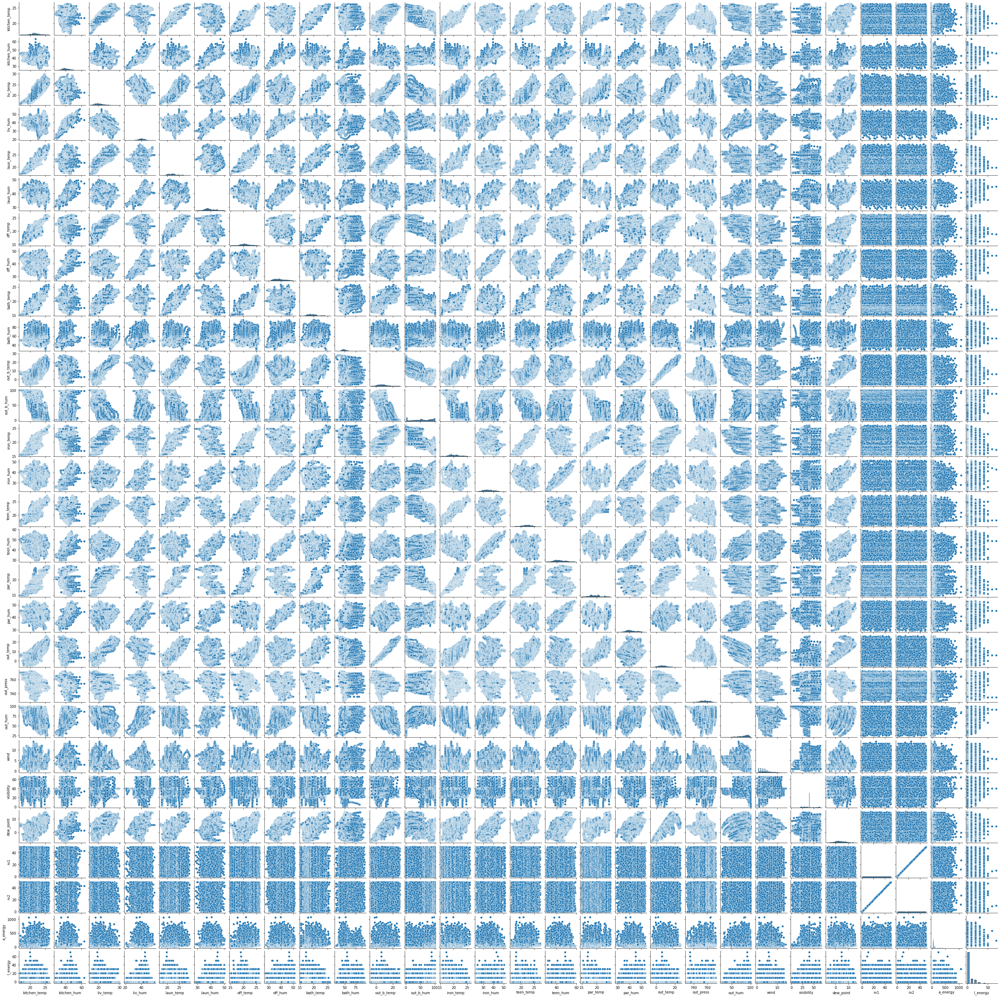

In [29]:
sns.pairplot(energy) 
plt.gcf().set_size_inches(40,40)

<AxesSubplot:>

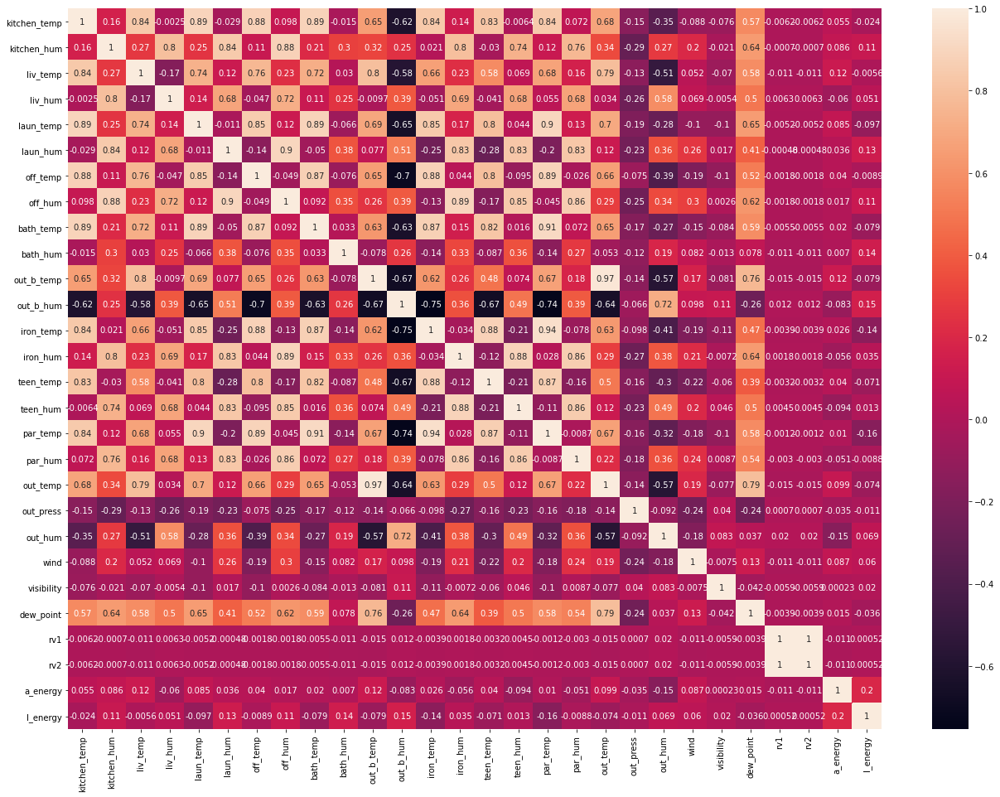

In [30]:
set_option('display.width', 100)
plt.figure(figsize=(22,16))
sns.heatmap(energy.corr(), annot=True)

From the chart, we can observe the following:
- everytime the temperature of a room inside the building increases, the temperature of other rooms inside and outside the building also increases significantly
- everytime the humidity of a room inside the building increases, the humidity of other rooms inside the house (except the bathroom and outside the building) increases significantly
- everytime the temperature in the building increases, the humidity outside the building drops significantly
- when the outdoor humidity increase, the humidity outside the buliding also increases significantly

# Finding the trend in the consumption of energy in the data
What period do appliances use up energy the most

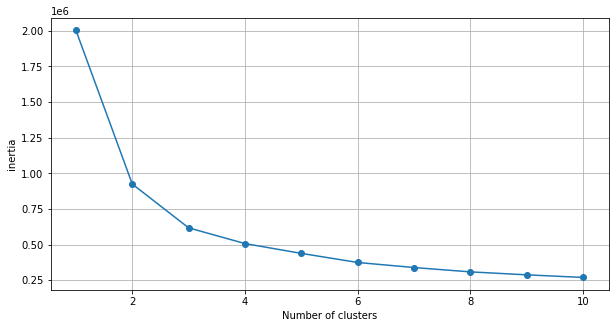

In [20]:
# creating a function to work out the optimum number of clusters for analysis

def optKMeans(dat, maxK):
    means = []
    inertias = []
    
    for k in range(1, maxK):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(dat)
        
        means.append(k)
        inertias.append(kmeans.inertia_)

    #generating the elbow plot
    fig = plt.subplots(figsize=(10,5))
    plt.plot(means, inertias, 'o-')
    plt.xlabel('Number of clusters')
    plt.ylabel('inertia')
    plt.grid(True)
    plt.show()

# identifying the cluster that works best for the bill statement columns
temp= optKMeans(energy[[ 'kitchen_temp', 'liv_temp',
                        'laun_temp', 'off_temp', 'bath_temp',
                        'out_b_temp', 'iron_temp', 'teen_temp',
                        'par_temp', 'out_temp', ]], 11)

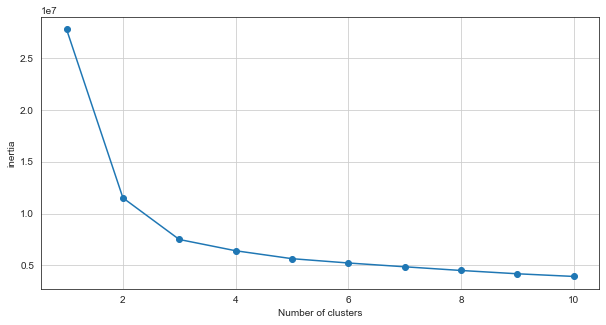

In [58]:
hum = optKMeans(energy[[ 'kitchen_hum', 'liv_hum',
                        'laun_hum', 'off_hum', 'bath_hum',
                        'out_b_hum', 'iron_hum',
                        'teen_hum', 'par_hum', 'out_hum']], 11)

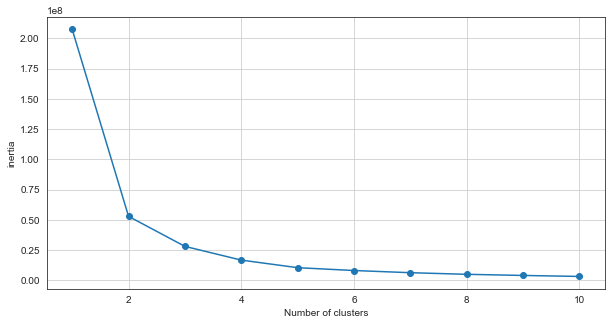

In [65]:
ene = optKMeans(energy[['a_energy']], 11)

In [4]:
# applying k means clustering so we can analyze each feature 

km = KMeans(n_clusters=3, init= 'k-means++', max_iter=300, n_init=10, random_state=0)

<AxesSubplot:ylabel='count'>

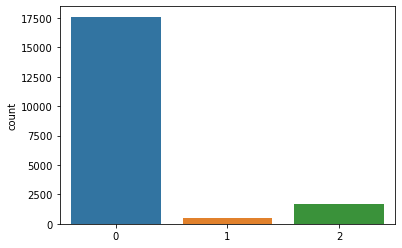

In [5]:
# organising the appliance energy used per day in a cluster and observing the trend

clusAppEne = km.fit_predict(energy[['a_energy']])
sns.countplot(x=clusAppEne, data=energy)
#sns.catplot(x='date_time', y=clusAppEne, data=energy)

In [6]:
# organising the a_energy and their clusters in a table to understand the plot properly
ax = pd.DataFrame(clusAppEne, energy['a_energy'])
ax = ax.rename(columns = {'a_energy' : 'a_energy', 0 : 'clusters'})

# to see the min and max range for each cluster
show = (ax[ax['clusters']==0])
show.sort_values(by='a_energy', ascending=True)

,clusters
a_energy,
10,0
10,0
10,0
10,0
10,0
...,...
170,0
170,0
170,0


this shows that:
- figures lower than 170 are in cluster 0
- figure within 180 - 420 are in cluster 2
- fugure above 430 are in cluster 1

The chart shows that almost all appliances use up 10wh - 170wh (as mentioned iin an earlier graph)

<AxesSubplot:ylabel='count'>

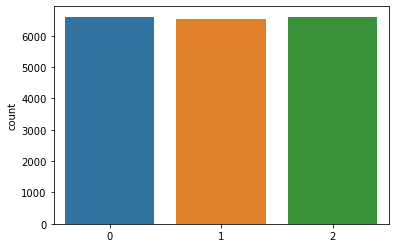

In [11]:
# finding the period energy is been used up the most
clusDate = km.fit_predict(energy[['date_time']])
sns.countplot(x=clusDate, data=energy)

In [12]:
ax = pd.DataFrame(clusDate, energy['date_time'])
ax = ax.rename(columns = {'date_time' : 'date_time', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='date_time', ascending=True)

,clusters
date_time,
2016-02-26 03:20:00,2
2016-02-26 03:30:00,2
2016-02-26 03:40:00,2
2016-02-26 03:50:00,2
2016-02-26 04:00:00,2
...,...
2016-04-11 20:00:00,2
2016-04-11 20:10:00,2
2016-04-11 20:20:00,2


- Cluster 1 is the late-winter period from 2016-01-11 to 2016-02-26
- Cluster 2 is the late-winter/early-spring period from 2016-02-26 to 2016-04-11
- Cluster 0 is the early-spring period from 2016-04-11 to 2016-05-27

The data was collected between January to May 2016

Text(0, 0.5, 'Appliances Energy')

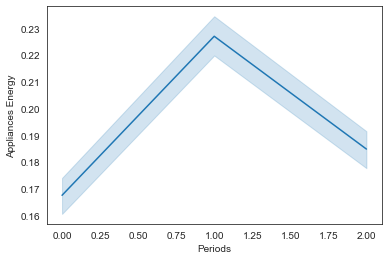

In [152]:
# displaying the trend in the use of energy
trend = sns.lineplot(x=clusDate, y=clusAppEne, data=energy, ci=68)
plt.xlabel('Periods')
plt.ylabel('Appliances Energy')

The trend here shows that appliances use up energy the most during the late-winter periods (dates under cluster 1)

# Finding the distribution of the temperature in each rooms

<AxesSubplot:ylabel='count'>

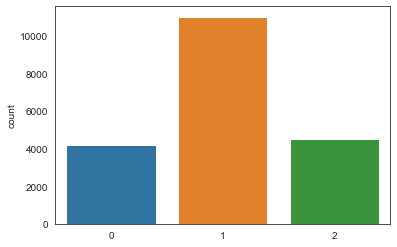

In [100]:
# Analysing the distribution for Kitchen Temperature
clusKit = km.fit_predict(energy[['kitchen_temp']])
sns.countplot(x=clusKit, data=energy)

In [176]:
KitTable = pd.DataFrame(clusKit, energy['kitchen_temp'])
KitTable = KitTable.rename(columns = {'kitchen_temp' : 'kitchen_temp', 0 : 'clusters'})

show = KitTable[KitTable['clusters']==0]
show.sort_values(by='kitchen_temp', ascending=True)

,clusters
kitchen_temp,
22.823333,0
22.823333,0
22.823333,0
22.823333,0
22.823333,0
...,...
26.200000,0
26.200000,0
26.260000,0


- 22.82 to 26.26 degree celcuis fall under cluster 0, collectively appearing 4185 times
- 20.67 to 22.82 degree celcuis fall under cluster 1, collectively appearing 11014 times
- 16.79 to 20.63 degree celcuis fall under cluster 2, collectively appearing 4536 times

The chart shows that from January 11 to May 27 2016, the Kitchen Temperature appears to be between 20.67 to 22.82 degree celcius most of the time

<AxesSubplot:ylabel='count'>

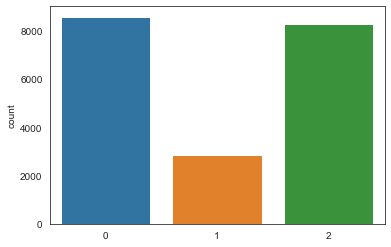

In [162]:
# Analysing the distribution for living room Temperature
clusLiv = km.fit_predict(energy[['liv_temp']])
sns.countplot(x=clusLiv, data=energy)

In [173]:
ax = pd.DataFrame(clusLiv, energy['liv_temp'])
ax = ax.rename(columns = {'liv_temp' : 'liv_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='liv_temp', ascending=True)

,clusters
liv_temp,
16.100000,0
16.100000,0
16.100000,0
16.100000,0
16.100000,0
...,...
19.666667,0
19.666667,0
19.672727,0


- 16.10 to 19.68 degree celcuis fall under cluster 0, collectively appearing 8579 times
- 22.61 to 29.86 degree celcuis fall under cluster 1, collectively appearing 2863 times
- 19.69 to 22.60 degree celcuis fall under cluster 2, collectively appearing 8293 times

The chart shows that from January 11 to May 27 2016, the Living room Temperature appears to be between 16.10 to 19.68 and 19.69 to 22.60 degree celcius most of the time

<AxesSubplot:ylabel='count'>

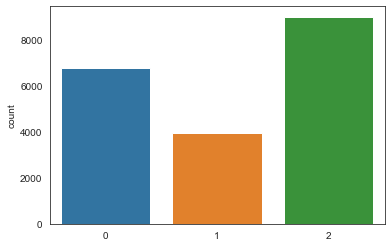

In [167]:
# Analysing the distribution for laundry room Temperature
clusLaun = km.fit_predict(energy[['laun_temp']])
sns.countplot(x=clusLaun, data=energy)

In [178]:
ax = pd.DataFrame(clusLaun, energy['laun_temp'])
ax = ax.rename(columns = {'laun_temp' : 'laun_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='laun_temp', ascending=True)

,clusters
laun_temp,
17.200000,0
17.200000,0
17.200000,0
17.230000,0
17.260000,0
...,...
21.326667,0
21.326667,0
21.326667,0


- 17.20 to 21.33 degree celcuis fall under cluster 0, collectively appearing 6773 times
- 23.90 to 29.24 degree celcuis fall under cluster 1, collectively appearing 3962 times
- 21.34 to 23.89 degree celcuis fall under cluster 2, collectively appearing 9000 times

The chart shows that from January 11 to May 27 2016, the laundry room Temperature was mostly between 21.34 to 23.89 degree celcius. it was also within 19.69 to 22.60 degree celcius for a good number of time.

<AxesSubplot:ylabel='count'>

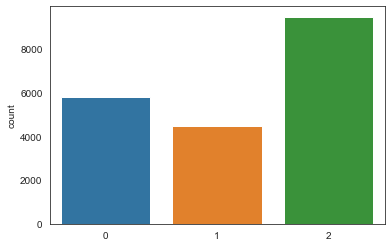

In [171]:
# Analysing the distribution for office room Temperature
clusOff = km.fit_predict(energy[['off_temp']])
sns.countplot(x=clusOff, data=energy)

In [181]:
ax = pd.DataFrame(clusOff, energy['off_temp'])
ax = ax.rename(columns = {'off_temp' : 'off_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='off_temp', ascending=True)

,clusters
off_temp,
15.10,0
15.10,0
15.10,0
15.10,0
15.10,0
...,...
19.73,0
19.73,0
19.73,0


- 15.10 to 19.73 degree celcuis fall under cluster 0, collectively appearing 5800 times
- 22.31 to 26.20 degree celcuis fall under cluster 1, collectively appearing 4483 times
- 19.73 to 22.31 degree celcuis fall under cluster 2, collectively appearing 9452 times

The chart shows that from January 11 to May 27 2016, the office room Temperature appears to be between 19.73 to 22.31 degree celcius most of the time

<AxesSubplot:ylabel='count'>

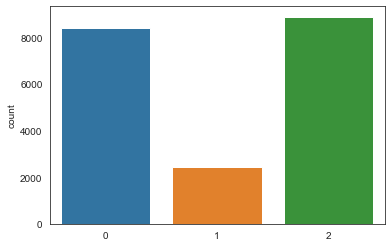

In [182]:
# Analysing the distribution for Bathroom Temperature
clusBath = km.fit_predict(energy[['bath_temp']])
sns.countplot(x=clusBath, data=energy)

In [185]:
ax = pd.DataFrame(clusBath, energy['bath_temp'])
ax = ax.rename(columns = {'bath_temp' : 'bath_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='bath_temp', ascending=True)

,clusters
bath_temp,
15.330,0
15.335,0
15.335,0
15.340,0
15.345,0
...,...
19.050,0
19.050,0
19.050,0


- 15.33 to 19.05 degree celcuis fall under cluster 0, collectively appearing 8390 times
- 21.66 to 25.80 degree celcuis fall under cluster 1, collectively appearing 2454 times
- 19.05 to 21.64 degree celcuis fall under cluster 2, collectively appearing 8891 times

The chart shows that from January 11 to May 27 2016, the bathroom Temperature appears to be between 15.33 to 19.05 and 19.05 to 21.64 degree celcius most of the time

<AxesSubplot:ylabel='count'>

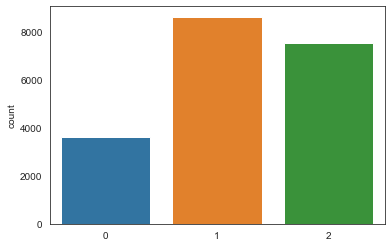

In [194]:
# Analysing the distribution for Ironing room Temperature
clusIron = km.fit_predict(energy[['iron_temp']])
sns.countplot(x=clusIron, data=energy)

In [200]:
ax = pd.DataFrame(clusIron, energy['iron_temp'])
ax = ax.rename(columns = {'iron_temp' : 'iron_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='iron_temp', ascending=True)

,clusters
iron_temp,
22.225714,0
22.225714,0
22.225714,0
22.225714,0
22.230000,0
...,...
25.890000,0
25.890000,0
25.926667,0


- 22.23 to 26.00 degree celcuis fall under cluster 0, collectively appearing 3620 times
- 15.39 to 19.60 degree celcuis fall under cluster 1, collectively appearing 8608 times
- 19.61 to 22.22 degree celcuis fall under cluster 2, collectively appearing 7507 times

The chart shows that from January 11 to May 27 2016, the ironing room Temperature appears to be between 22.23 to 26.00 and 19.61 to 22.22 degree celcius most of the time

<AxesSubplot:ylabel='count'>

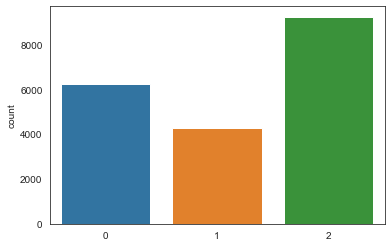

In [201]:
# Analysing the distribution for teenager room Temperature
clusTeen = km.fit_predict(energy[['teen_temp']])
sns.countplot(x=clusTeen, data=energy)

In [210]:
ax = pd.DataFrame(clusTeen, energy['teen_temp'])
ax = ax.rename(columns = {'teen_temp' : 'teen_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='teen_temp', ascending=True)

,clusters
teen_temp,
23.025000,0
23.027778,0
23.027778,0
23.027778,0
23.028571,0
...,...
27.133333,0
27.200000,0
27.200000,0


- 23.02 to 27.23 degree celcuis fall under cluster 0, collectively appearing 6218 times
- 16.30 to 20.56 degree celcuis fall under cluster 1, collectively appearing 4281 times
- 20.56 to 23.02 degree celcuis fall under cluster 2, collectively appearing 9236 times

The chart shows that from January 11 to May 27 2016, the teenager room Temperature appears to be between 20.56 to 23.02 degree celcius for a good number of the time

<AxesSubplot:ylabel='count'>

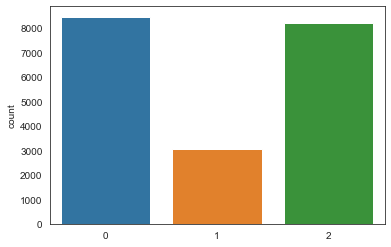

In [207]:
# Analysing the distribution for parents room Temperature
clusPar = km.fit_predict(energy[['par_temp']])
sns.countplot(x=clusPar, data=energy)

In [213]:
ax = pd.DataFrame(clusPar, energy['par_temp'])
ax = ax.rename(columns = {'par_temp' : 'par_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='par_temp', ascending=True)

,clusters
par_temp,
18.823333,0
18.823333,0
18.823333,0
18.823333,0
18.823333,0
...,...
21.500000,0
21.500000,0
21.500000,0


- 18.82 to 21.50 degree celcuis fall under cluster 0, collectively appearing 8456 times
- 22.61 to 29.86 degree celcuis fall under cluster 1, collectively appearing 3071 times
- 14.89 to 18.81 degree celcuis fall under cluster 2, collectively appearing 8208 times

The chart shows that from January 11 to May 27 2016, the parents room Temperature appears to be between 18.82 to 21.50 and 14.89 to 18.81 degree celcius most of the time

This means that with increasing temperature onside the house, more appliance are in use

# Finding the distribution of the humidity in each rooms

<AxesSubplot:ylabel='count'>

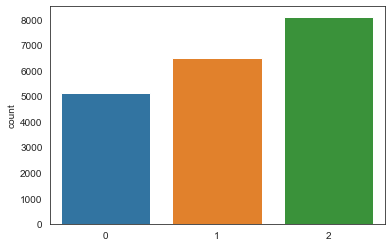

In [214]:
# Analysing the distribution for kitchen humidity
clusKitH = km.fit_predict(energy[['kitchen_hum']])
sns.countplot(x=clusKitH, data=energy)

In [217]:
ax = pd.DataFrame(clusKitH, energy['kitchen_hum'])
ax = ax.rename(columns = {'kitchen_hum' : 'kitchen_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='kitchen_hum', ascending=True)

,clusters
kitchen_hum,
38.163333,2
38.163333,2
38.163333,2
38.163333,2
38.163333,2
...,...
42.866667,2
42.866667,2
42.890000,2


- 42.89% to 63.36% humidity fall under cluster 0, collectively appearing 5135 times
- 27.02% to 38.16% humidity fall under cluster 1, collectively appearing 6501 times
- 38.16% to 42.89% humidity fall under cluster 2, collectively appearing 8099 times

The chart shows that from January 11 to May 27 2016, the kitchen humidity appears to be between 38.16 to 42.89% and 27.02% to 38.16% most of the time. it also reached 42.89% to 63.36% humidity a good number of times

<AxesSubplot:ylabel='count'>

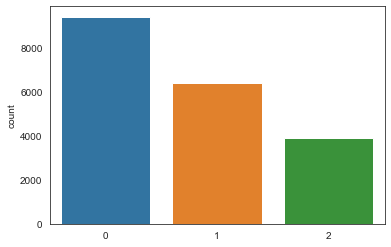

In [218]:
# Analysing the distribution for living room humidity
clusLivH = km.fit_predict(energy[['liv_hum']])
sns.countplot(x=clusLivH, data=energy)

In [221]:
ax = pd.DataFrame(clusLivH, energy['liv_hum'])
ax = ax.rename(columns = {'liv_hum' : 'liv_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='liv_hum', ascending=True)

,clusters
liv_hum,
20.463333,2
20.596667,2
20.833333,2
20.893333,2
21.040000,2
...,...
37.230000,2
37.230000,2
37.230000,2


- 37.24% to 42.34% humidity fall under cluster 0, collectively appearing 9426 times
- 42.35% to 56.02% humidity fall under cluster 1, collectively appearing 6391 times
- 20.46% to 37.24% humidity fall under cluster 2, collectively appearing 3918 times

The chart shows that from January 11 to May 27 2016, the living room humidity appears to be between 37.24% to 42.34% and 42.35% to 56.02% most of the time. 

<AxesSubplot:ylabel='count'>

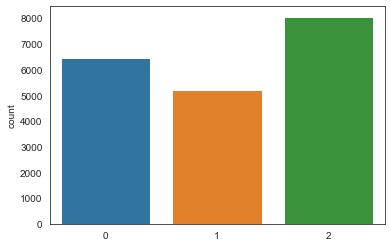

In [222]:
# Analysing the distribution for laundry room humidity
clusLaunH = km.fit_predict(energy[['laun_hum']])
sns.countplot(x=clusLaunH, data=energy)

In [225]:
ax = pd.DataFrame(clusLaunH, energy['laun_hum'])
ax = ax.rename(columns = {'laun_hum' : 'laun_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='laun_hum', ascending=True)

,clusters
laun_hum,
37.411429,2
37.414286,2
37.420000,2
37.422857,2
37.424026,2
...,...
41.363333,2
41.363333,2
41.363333,2


- 28.77% to 37.40% humidity fall under cluster 0, collectively appearing 6463 times
- 41.37% to 50.16% humidity fall under cluster 1, collectively appearing 5216 times
- 37.41% to 41.36% humidity fall under cluster 2, collectively appearing 8056 times

The chart shows that from January 11 to May 27 2016, the laundry room humidity appears to be between 37.41% to 41.36% and 28.77% to 37.40% most of the time. it also reached 41.37% to 50.16% humidity a good number of times

<AxesSubplot:ylabel='count'>

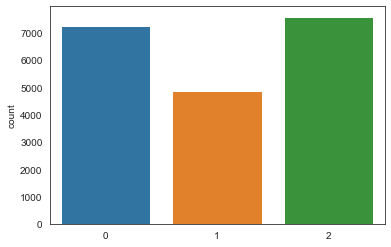

In [226]:
# Analysing the distribution for office room humidity
clusOffH = km.fit_predict(energy[['off_hum']])
sns.countplot(x=clusOffH, data=energy)

In [229]:
ax = pd.DataFrame(clusOffH, energy['off_hum'])
ax = ax.rename(columns = {'off_hum' : 'off_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='off_hum', ascending=True)

,clusters
off_hum,
36.966667,2
36.966667,2
36.966667,2
36.966667,2
36.966667,2
...,...
42.200000,2
42.200000,2
42.200000,2


- 27.66% to 38.96% humidity fall under cluster 0, collectively appearing 7269 times
- 42.22% to 51.09% humidity fall under cluster 1, collectively appearing 6501 times
- 36.96% to 42.21% humidity fall under cluster 2, collectively appearing 8099 times

The chart shows that from January 11 to May 27 2016, the office room humidity appears to be between 36.96% to 42.21% and 27.66% to 38.96% most of the time.

<AxesSubplot:ylabel='count'>

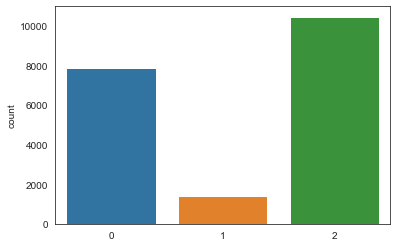

In [230]:
# Analysing the distribution for bathroom humidity
clusBathH = km.fit_predict(energy[['bath_hum']])
sns.countplot(x=clusBathH, data=energy)

In [234]:
ax = pd.DataFrame(clusBathH, energy['bath_hum'])
ax = ax.rename(columns = {'bath_hum' : 'bath_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='bath_hum', ascending=True)

,clusters
bath_hum,
29.815000,2
29.856667,2
30.030000,2
30.033333,2
30.166667,2
...,...
49.638889,2
49.645000,2
49.645000,2


- 49.66% to 65.27% humidity fall under cluster 0, collectively appearing 7886 times
- 65.28% to 96.32% humidity fall under cluster 1, collectively appearing 1390 times
- 29.81% to 49.65% humidity fall under cluster 2, collectively appearing 8099 times

The chart shows that from January 11 to May 27 2016, the bathroom humidity appears to be between 29.81% to 49.65% and 49.66% to 65.27% most of the time. 

<AxesSubplot:ylabel='count'>

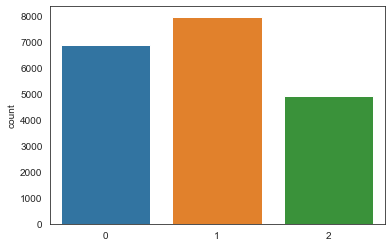

In [235]:
# Analysing the distribution for ironing room humidity
clusIronH = km.fit_predict(energy[['iron_hum']])
sns.countplot(x=clusIronH, data=energy)

In [240]:
ax = pd.DataFrame(clusIronH, energy['iron_hum'])
ax = ax.rename(columns = {'iron_hum' : 'iron_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='iron_hum', ascending=True)

,clusters
iron_hum,
39.045000,2
39.045000,2
39.045000,2
39.045000,2
39.045000,2
...,...
51.151111,2
51.175556,2
51.197778,2


- 23.20% to 32.87% humidity fall under cluster 0, collectively appearing 6866 times
- 32.88% to 38.04% humidity fall under cluster 1, collectively appearing 7969 times
- 39.04% to 51.40% humidity fall under cluster 2, collectively appearing 4900 times

The chart shows that from January 11 to May 27 2016, the bathroom humidity appears to be between 32.88% to 38.04 and 23.20% to 32.87 most of the time. it also reached 42.89% to 63.36% humidity a good number of times

<AxesSubplot:ylabel='count'>

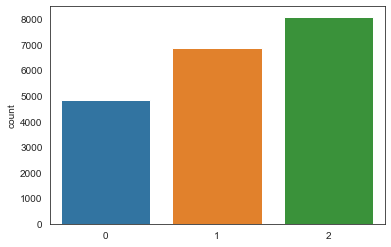

In [241]:
# Analysing the distribution for teenager room humidity
clusTeenH = km.fit_predict(energy[['teen_hum']])
sns.countplot(x=clusTeenH, data=energy)

In [247]:
ax = pd.DataFrame(clusTeenH, energy['teen_hum'])
ax = ax.rename(columns = {'teen_hum' : 'teen_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='teen_hum', ascending=True)

,clusters
teen_hum,
40.352857,2
40.360000,2
40.360000,2
40.360000,2
40.360000,2
...,...
46.686667,2
46.687778,2
46.691667,2


- 46.70% to 58.78% humidity fall under cluster 0, collectively appearing 4821 times
- 29.60% to 40.34% humidity fall under cluster 1, collectively appearing 6841 times
- 40.35% to 46.69% humidity fall under cluster 2, collectively appearing 8073 times

The chart shows that from January 11 to May 27 2016, the bathroom humidity appears to be between 40.35% to 46.69% and 29.60% to 40.34% most of the time. it also reached 46.70% to 58.78% humidity a good number of times

<AxesSubplot:ylabel='count'>

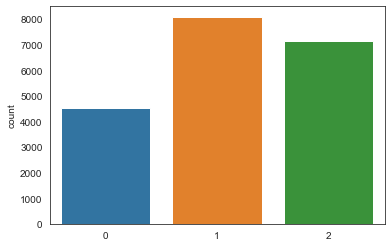

In [248]:
# Analysing the distribution for parent room humidity
clusParH = km.fit_predict(energy[['par_hum']])
sns.countplot(x=clusParH, data=energy)

In [254]:
ax = pd.DataFrame(clusParH, energy['par_hum'])
ax = ax.rename(columns = {'par_hum' : 'par_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='par_hum', ascending=True)

,clusters
par_hum,
39.884286,2
39.890000,2
39.890000,2
39.890000,2
39.890000,2
...,...
44.826667,2
44.826667,2
44.826667,2


- 44.84% to 53.33% humidity fall under cluster 0, collectively appearing 4504 times
- 29.17% to 39.88% humidity fall under cluster 1, collectively appearing 8088 times
- 39.88% to 44.83% humidity fall under cluster 2, collectively appearing 7143 times

The chart shows that from January 11 to May 27 2016, the bathroom humidity appears to be between 29.17% to 39.88% and 39.88% to 44.83% degree celcius most of the time. it also reached 44.84% to 53.33% humidity a good number of times

# Finding the distribution of features outside the house

<AxesSubplot:ylabel='count'>

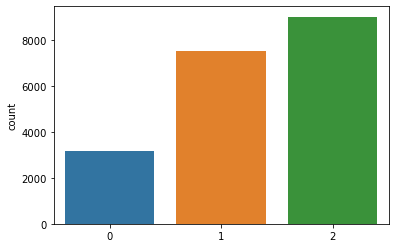

In [14]:
# Analysing the distribution for outside room Temperature
clusOut = km.fit_predict(energy[['out_temp']])
sns.countplot(x=clusOut, data=energy)

In [17]:
ax = pd.DataFrame(clusOut, energy['out_temp'])
ax = ax.rename(columns = {'out_temp' : 'out_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='out_temp', ascending=True)

,clusters
out_temp,
5.416667,2
5.416667,2
5.416667,2
5.416667,2
5.416667,2
...,...
12.350000,2
12.350000,2
12.350000,2


- 12.38 to 26.10 degree celcuis fall under cluster 0, collectively appearing 3180 times
- -5 to 5.41 degree celcuis fall under cluster 1, collectively appearing 7521 times
- 5.42 to 12.16 degree celcuis fall under cluster 2, collectively appearing 9034 times

The chart shows that from January 11 to May 27 2016, the temperature outside appears to be between 5.42 to 12.16 and -5 to 5.41 degree celcius most of the time

This means it has nothing to do with the consumption of energy

<AxesSubplot:ylabel='count'>

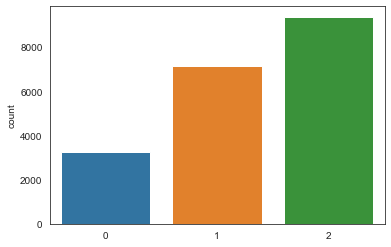

In [193]:
# Analysing the distribution for outside the building room Temperature
clusOutB = km.fit_predict(energy[['out_b_temp']])
sns.countplot(x=clusOutB, data=energy)

In [192]:
ax = pd.DataFrame(clusOutB, energy['out_b_temp'])
ax = ax.rename(columns = {'out_b_temp' : 'out_b_temp', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='out_b_temp', ascending=True)

,clusters
out_b_temp,
13.490000,0
13.490000,0
13.490000,0
13.490714,0
13.495000,0
...,...
28.150000,0
28.200000,0
28.218000,0


- 16.10 to 19.68 degree celcuis fall under cluster 0, collectively appearing 3249 times
- -6.06 to 5.43 degree celcuis fall under cluster 1, collectively appearing 7118 times
- 19.69 to 22.60 degree celcuis fall under cluster 2, collectively appearing 9368 times

The chart shows that from January 11 to May 27 2016, the temperature outside the building appears to be between 19.69 to 22.60 and -6.06 to 5.43 degree celcius most of the time

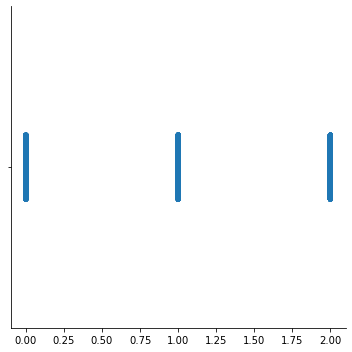

In [22]:
clusOutBH = km.fit_predict(energy[['out_b_hum']])
sns.catplot(x=clusOutBH, data=energy)

In [25]:
ax = pd.DataFrame(clusOutBH, energy['out_b_hum'])
ax = ax.rename(columns = {'out_b_hum' : 'out_b_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==2])
show.sort_values(by='out_b_hum', ascending=True)

,clusters
out_b_hum,
31.566364,2
31.566667,2
31.590000,2
31.593333,2
31.593333,2
...,...
68.860000,2
68.866667,2
68.896667,2


- 1% to 31.56% humidity fall under cluster 0, collectively appearing 5163 times
- 31.57% to 68.90% humidity fall under cluster 2, collectively appearing 7044 times
- 68.93% to 99.90% humidity fall under cluster 1, collectively appearing 7528 times

The chart shows that from January 11 to May 27 2016, the humidity outside the building appears to be between 68.93% to 99.90% and 31.57% to 68.90% most of the time. it also reached 1% to 31.56% humidity a good number of times

<AxesSubplot:ylabel='count'>

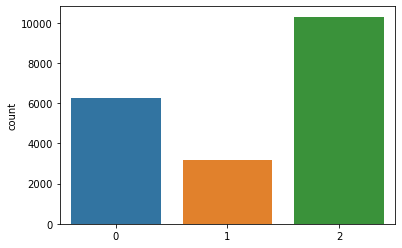

In [26]:
clusOutH = km.fit_predict(energy[['out_hum']])
sns.countplot(x=clusOutH, data=energy)

In [33]:
ax = pd.DataFrame(clusOutH, energy['out_hum'])
ax = ax.rename(columns = {'out_hum' : 'out_hum', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='out_hum', ascending=True)

,clusters
out_hum,
63.750000,0
63.833333,0
63.833333,0
63.833333,0
63.833333,0
...,...
82.666667,0
82.666667,0
82.666667,0


- 24.00% to 63.67% humidity fall under cluster 1, collectively appearing 3173 times
- 63.75% to 82.67% humidity fall under cluster 0, collectively appearing 6262 times
- 82.83% to 100% humidity fall under cluster 2, collectively appearing 10300 times

The chart shows that from January 11 to May 27 2016, the bathroom humidity appears to be between 82.83% to 100% most of the time. it also reached 63.75% to 82.67% humidity a good number of times

<AxesSubplot:ylabel='count'>

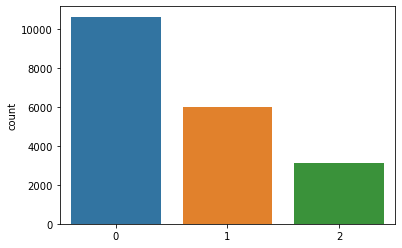

In [34]:
visi = km.fit_predict(energy[['visibility']])
sns.countplot(x=visi, data=energy)

In [40]:
ax = pd.DataFrame(visi, energy['visibility'])
ax = ax.rename(columns = {'visibility' : 'visibility', 0 : 'clusters'})

show = (ax[ax['clusters']==1])
show.sort_values(by='visibility', ascending=True)

,clusters
visibility,
1.000000,1
1.000000,1
1.000000,1
1.000000,1
1.000000,1
...,...
32.000000,1
32.055556,1
32.166667,1


- 49.67km to 66.00km visibility fall under cluster 2, collectively appearing 3122 times
- 1km to 32.17km visibility fall under cluster 1, collectively appearing 5980 times
- 32.33% to 49.50km visibility fall under cluster 0, collectively appearing 10633 times

The chart shows that from January 11 to May 27 2016, the visibility in km appears to be between 32.33% to 49.50km most of the time. it also reached 1km to 32.17km a good number of times

<AxesSubplot:ylabel='count'>

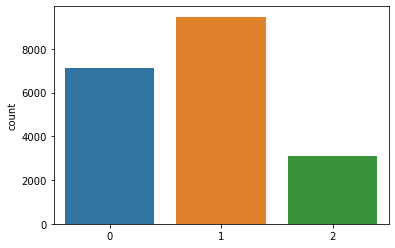

In [41]:
wind = km.fit_predict(energy[['wind']])
sns.countplot(x=wind, data=energy)

In [46]:
ax = pd.DataFrame(wind, energy['wind'])
ax = ax.rename(columns = {'wind' : 'wind', 0 : 'clusters'})

show = (ax[ax['clusters']==0])
show.sort_values(by='wind', ascending=True)

,clusters
wind,
3.416667,0
3.428571,0
3.444444,0
3.444444,0
3.500000,0
...,...
6.500000,0
6.500000,0
6.500000,0


- 6.67m/s to 14.00m/s wind speed fall under cluster 2, collectively appearing 3122 times
- 3.42m/s to 6.57m/s wind speed fall under cluster 0, collectively appearing 7145 times
- 0m/s to 3.39m/s wind speed fall under cluster 1, collectively appearing 9468 times

The chart shows that from January 11 to May 27 2016, the wind speed in m/s appears to be between 0m/s to 6.57m/s most of the time.